In [1]:
import pandas as pd
import numpy as np
import time
import warnings
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
import xgboost as xgb
from sklearn.feature_selection import RFECV
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold, cross_val_score, cross_val_predict
random_state=0

In [2]:
df= pd.read_csv('winequality.csv')
df.head()
df.shape

(1599, 12)

In [3]:
df.head()

,fixed acidity,volatile acidity,citric acid,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,residual sugar
0,7.4,0.70,0.00,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1.9
1,7.8,0.88,0.00,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,2.6
2,7.8,0.76,0.04,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,2.3
3,11.2,0.28,0.56,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,1.9
4,7.4,0.70,0.00,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1.9


In [4]:
X = df.iloc[:, :-1] 
y = df.iloc[:, -1] 
# Perform RFE with cross-validation
rfe_cv = RFECV(RandomForestRegressor(n_estimators=100, random_state=0), scoring='neg_mean_absolute_error', cv=10)
rfe_cv.fit(X, y)

# Get the optimal number of features
optimal_n = rfe_cv.n_features_
print('Optimal number of features:', optimal_n)

# Get the mask of selected features
selected_features_mask = rfe_cv.support_

# Print the selected feature names
selected_feature_names = np.array(X.columns)[selected_features_mask]
print("Selected features:", selected_feature_names)

# Create a new DataFrame with the selected features
X_selected = X.iloc[:, selected_features_mask]

X= X_selected

Optimal number of features: 5
Selected features: ['fixed acidity' 'free sulfur dioxide' 'total sulfur dioxide' 'density'
 'alcohol']


In [5]:
X

,fixed acidity,free sulfur dioxide,total sulfur dioxide,density,alcohol
0,7.4,11.0,34.0,0.99780,9.4
1,7.8,25.0,67.0,0.99680,9.8
2,7.8,15.0,54.0,0.99700,9.8
3,11.2,17.0,60.0,0.99800,9.8
4,7.4,11.0,34.0,0.99780,9.4
...,...,...,...,...,...
1594,6.2,32.0,44.0,0.99490,10.5
1595,5.9,39.0,51.0,0.99512,11.2
1596,6.3,29.0,40.0,0.99574,11.0
1597,5.9,32.0,44.0,0.99547,10.2


In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)

# Random Forest
start_time_rf = time.time()
ranf = RandomForestRegressor(random_state=0)
rf = ranf.fit(X_train, y_train)
scores_rf = cross_val_score(rf, X_train, y_train, scoring='neg_mean_absolute_error', cv=10)
y_pred_rf = cross_val_predict(ranf, X_test, y_test)
scores_test_rf = cross_val_score(ranf, X_test, y_test, scoring='neg_mean_absolute_error', cv=10)
runtime_rf = time.time() - start_time_rf
print("Runtime for Random Forest:", runtime_rf)
#print("Mean Absolute Error (Train):", np.mean(scores_dt) * -1)
print("Mean Absolute Error (Test):", np.mean(scores_test_rf) * -1)
print()


# Decision Tree
start_time_dt = time.time()
dectree = DecisionTreeRegressor(random_state=0)
dt = dectree.fit(X_train, y_train)
scores_dt = cross_val_score(dt, X_train, y_train, scoring='neg_mean_absolute_error', cv=10)
y_pred_dt = cross_val_predict(dectree, X_test, y_test)
scores_test_dt = cross_val_score(dectree, X_test, y_test, scoring='neg_mean_absolute_error', cv=10)
runtime_dt = time.time() - start_time_dt
print("Runtime for Decision Tree:", runtime_dt)
#print("Results for Decision Tree:")
#print("Mean Absolute Error (Train):", np.mean(scores_dt) * -1)
print("Mean Absolute Error (Test):", np.mean(scores_test_dt) * -1)
print()

# K-Nearest Neighbors
start_time_knn = time.time()
knn_model = KNeighborsRegressor(n_neighbors=5).fit(X_train, y_train)
y_pred_knn = cross_val_predict(knn_model, X_test, y_test)
scores_test_knn = cross_val_score(knn_model, X_test, y_test, scoring='neg_mean_absolute_error', cv=10)
runtime_knn = time.time() - start_time_knn
print("Runtime for K-Nearest Neighbors:", runtime_knn)
#print("Mean Absolute Error (Train):", np.mean(scores_knn) * -1)
print("Mean Absolute Error (Test):", np.mean(scores_test_knn) * -1)
print()


# XGBoost
start_time_xgb = time.time()
xgb_reg = xgb.XGBRegressor(random_state=0)
scores_xgb = cross_val_score(xgb_reg, X_train, y_train, scoring='neg_mean_absolute_error', cv=10)
y_pred_xgb = cross_val_predict(xgb_reg, X_test, y_test)
scores_test_xgb = cross_val_score(xgb_reg, X_test, y_test, scoring='neg_mean_absolute_error', cv=10)
runtime_xgb = time.time() - start_time_xgb
print("Runtime for XGBoost:", runtime_xgb)
#print("Mean Absolute Error (Train):", np.mean(scores_xgb) * -1)
print("Mean Absolute Error (Test):", np.mean(scores_test_xgb) * -1)
print()

Runtime for Random Forest: 4.493878364562988
Mean Absolute Error (Test): 0.5859546875

Runtime for Decision Tree: 0.08310103416442871
Mean Absolute Error (Test): 0.7548437499999999

Runtime for K-Nearest Neighbors: 0.024500608444213867
Mean Absolute Error (Test): 0.7256875

Runtime for XGBoost: 4.591062545776367
Mean Absolute Error (Test): 0.6547357692569495



In [7]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size= 0.20,random_state=0)

# Random Forest
ranf = RandomForestRegressor(random_state=0)
rf = ranf.fit(X_train, y_train)
scores_rf = cross_val_score(rf, X_train, y_train, scoring='neg_mean_absolute_error', cv=10)

y_pred_rf = cross_val_predict(ranf, X_test, y_test)
scores_test_rf = cross_val_score(ranf, X_test, y_test, scoring='neg_mean_absolute_error', cv=10)
print(np.mean(scores_test_rf) * -1)

# Decision Tree
dectree = DecisionTreeRegressor(random_state=0)
dt = dectree.fit(X_train, y_train)
scores_dt = cross_val_score(dt, X_train, y_train, scoring='neg_mean_absolute_error', cv=10)

y_pred_dt = cross_val_predict(dectree, X_test, y_test)
scores_test_dt = cross_val_score(dectree, X_test, y_test, scoring='neg_mean_absolute_error', cv=10)
print(np.mean(scores_test_dt) * -1)

# K-Nearest Neighbors
knn_model = KNeighborsRegressor(n_neighbors=5).fit(X_train, y_train)
y_pred_knn = cross_val_predict(knn_model, X_test, y_test)
scores_test_knn = cross_val_score(knn_model, X_test, y_test, scoring='neg_mean_absolute_error', cv=10)
print(np.mean(scores_test_knn) * -1)

# Create an XGBoost regressor
xgb_reg = xgb.XGBRegressor(random_state=0)
scores_xgb = cross_val_score(xgb_reg, X_train, y_train, scoring='neg_mean_absolute_error', cv=10)
y_pred_xgb = cross_val_predict(xgb_reg, X_test, y_test)
scores_test_xgb = cross_val_score(xgb_reg, X_test, y_test, scoring='neg_mean_absolute_error', cv=10)
print(np.mean(scores_test_xgb) * -1)

0.5859546875
0.7548437499999999
0.7256875
0.6547357692569495


In [8]:
X1=X
X1

,fixed acidity,free sulfur dioxide,total sulfur dioxide,density,alcohol
0,7.4,11.0,34.0,0.99780,9.4
1,7.8,25.0,67.0,0.99680,9.8
2,7.8,15.0,54.0,0.99700,9.8
3,11.2,17.0,60.0,0.99800,9.8
4,7.4,11.0,34.0,0.99780,9.4
...,...,...,...,...,...
1594,6.2,32.0,44.0,0.99490,10.5
1595,5.9,39.0,51.0,0.99512,11.2
1596,6.3,29.0,40.0,0.99574,11.0
1597,5.9,32.0,44.0,0.99547,10.2


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.521794871794872
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2686274509803925
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4200000000000004
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3525
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4055555555555554
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.790909090909091
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.828125
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6968750000000004
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2073170731707314
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.737096774193548
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1166666666666667
Column:

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.4712500000000004
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.175
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.51764705882353
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.3850000000000002
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.26734693877551
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.758
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.412962962962963
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8461538461538463
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7806451612903222
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6558823529411764
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2155555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.7359375
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1461538461538465
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5781249999

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5321428571428575
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.230232558139535
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3560975609756096
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.276190476190476
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.789583333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.0478260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9749999999999996
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7266666666666666
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.308333333333333
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.224390243902439
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6785714285714284
Column: fixed acidity, Value: 0.557522123893805

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.528048780487805
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2622222222222224
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.439473684210526
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.310526315789474
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.784782608695652
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9583333333333335
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.217647058823529
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2090909090909094
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.223809523809524
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.670833333333333
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.161538461538462
Column: fixed acidity, Value: 0.6283185840707964, 

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5304878048780486
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.3204545454545458
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8875
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.413513513513514
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4052631578947365
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.7063829787234037
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4717391304347824
Column: fixed acidity, Value: 0.495575221238938, Mean: 3.0181818181818176
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.284615384615385
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.207692307692308
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.605555555555555
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.565277777777778
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.5328947368421058
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2920000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.417948717948718
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.782
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.46875
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.9250000000000003
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8388888888888886
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.5999999999999996
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.289473684210526
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.1472222222222226
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2318181818181815
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.692424242424243
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.04545454545

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.46025641025641
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.217021276595745
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4315789473684206
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.395121951219512
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.778260869565217
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.4729166666666664
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8620689655172415
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.3666666666666663
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3000000000000003
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.69
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.233333333333334
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2428571428571424
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.490

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.253846153846154
Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.327777777777778
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.3975
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.795833333333333
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.428260869565217
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.7037037037037037
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.563157894736842
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3041666666666667
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2275
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.564285714285714
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.1571428571428575
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.520192307692308
Column: fixed acidity, Value: 0.7345132743362832, Mean: 2.431428571428571

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.535365853658537
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.1999999999999997
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.77
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.4263157894736844
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.2717948717948717
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.6727272727272724
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394642857142857
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.8846153846153846
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.835483870967742
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6928571428571426
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.2666666666666666
Column: fixed acidity, Value: 0.6283185840707964, Mean: 2.5519607843137257
Column: fixed acidity, Value: 0.6106194690265

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Column: fixed acidity, Value: 0.6548672566371682, Mean: 2.52948717948718
Column: fixed acidity, Value: 0.6902654867256637, Mean: 2.2880000000000003
Column: fixed acidity, Value: 0.991150442477876, Mean: 2.8375
Column: fixed acidity, Value: 0.6991150442477876, Mean: 2.405555555555556
Column: fixed acidity, Value: 0.6460176991150441, Mean: 2.4230769230769234
Column: fixed acidity, Value: 0.663716814159292, Mean: 2.551111111111111
Column: fixed acidity, Value: 0.5929203539823009, Mean: 2.394444444444444
Column: fixed acidity, Value: 0.495575221238938, Mean: 2.823076923076923
Column: fixed acidity, Value: 0.7876106194690266, Mean: 2.8218750000000004
Column: fixed acidity, Value: 0.7522123893805309, Mean: 2.6750000000000003
Column: fixed acidity, Value: 0.7168141592920353, Mean: 2.3434782608695657
Column: fixed acidity, Value: 0.6725663716814159, Mean: 2.214634146341463
Column: fixed acidity, Value: 0.6106194690265486, Mean: 2.6625
Column: fixed acidity, Value: 0.5575221238938053, Mean: 2.2

/usr/lib/python3/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-9-37475435d691>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[X_train[col] == val, col] = means[(col, val)]
<ipython-input-9-37475435d691>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[X_test[col] == val, col] = means[(col, val)]


Runtime for Proposed: 884.1580438613892


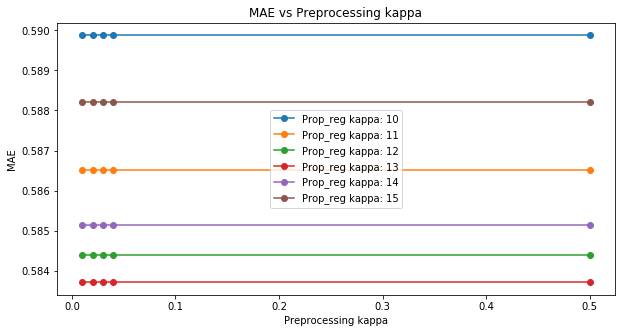

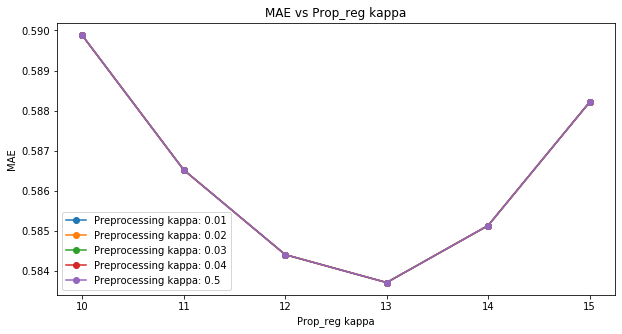

Optimal Preprocessing kappa: 0.01
Optimal Prop_reg kappa: 13
Minimum MAE: 0.5837064816928036


In [9]:
start_time_pr = time.time()
def normalize(X1):
    result = X1.copy()
    for feature_name in X1.columns:
        max_value = X1[feature_name].max()
        min_value = X1[feature_name].min()
        result[feature_name] = X1[feature_name] / (max_value - min_value)
    return result

X = normalize(X1)
X
def preprocess_data(X_train, X_test, y_train, kappa, ordinal_columns):
    X_train, X_test = handle_categorical(X_train, X_test, y_train, ordinal_columns)
    X_train, X_test = handle_ordinal(X_train, X_test, y_train, kappa, ordinal_columns)
    return X_train, X_test


def handle_categorical(X_train, X_test, y_train, ordinal_columns):
    means = {}

    for col in X_train.columns:
        if col not in ordinal_columns:  # Categorical variable
            unique_values_train = X_train[col].unique()
            unique_values_test = X_test[col].unique()

            for val in unique_values_train:
                mean = y_train[X_train[col] == val].mean()
                means[(col, val)] = mean
                print(f"Column: {col}, Value: {val}, Mean: {mean}")

            for val in unique_values_test:
                if val not in unique_values_train:
                    print(f"Warning: Value {val} in column {col} of X_test is not in X_train.")

    for col, val in means:
        X_train.loc[X_train[col] == val, col] = means[(col, val)]
        X_test.loc[X_test[col] == val, col] = means[(col, val)]

    return X_train, X_test


def handle_ordinal(X_train, X_test, y_train, kappa, ordinal_columns):
    missing_values = {}

    for col in X_train.columns:
        if col in ordinal_columns:  # Ordinal variable
            unique_values_train = X_train[col].unique()
            unique_values_test = X_test[col].unique()

            for val in unique_values_test:
                y_train_np = y_train.to_numpy()
                X_train_col_np = X_train[[col]].to_numpy()
                X_test_col_val = val
                l = 0
                v = 0
                for j in range(X_train_col_np.shape[0]):
                    d = abs(X_test_col_val - X_train_col_np[j])
                    l += y_train_np[j] / ((1 + d) ** kappa)
                    v += 1 / ((1 + d) ** kappa)
                imputed_value = l / v
                missing_values[(col, val)] = imputed_value

            for val in unique_values_train:
                if val not in unique_values_test:
                    y_train_np = y_train.to_numpy()
                    X_train_col_np = X_train[[col]].to_numpy()
                    X_train_col_val = val
                    l = 0
                    v = 0
                    for j in range(X_train_col_np.shape[0]):
                        d = abs(X_train_col_val - X_train_col_np[j])
                        l += y_train_np[j] / ((1 + d) ** kappa)
                        v += 1 / ((1 + d) ** kappa)
                    imputed_value = l / v
                    missing_values[(col, val)] = imputed_value

    for col, val in missing_values:
        X_train.loc[X_train[col] == val, col] = missing_values[(col, val)]
        X_test.loc[X_test[col] == val, col] = missing_values[(col, val)]

    return X_train, X_test



def prop_reg(X_test,X_train,y_train,y_test,kappa):
    d = np.zeros((len(X_test),len(X_train)))
    for i in range(len(X_test)):
        for j in range(len(X_train)):
            d[i,j] = np.linalg.norm(X_test[i]-X_train[j])
    c=np.zeros(len(y_test))
    for i in range(len(y_test)):
        l=0
        v=0
        for j in range(len(y_train)):
            
            l+=y_train[j]/((1+d[i,j])**kappa)
            v+=1/((1+d[i,j])**kappa)
        
        c[i]=l/v
    return(c)


def kfold_cv(X, y, ordinal_columns, kappa_values_preprocessing, kappa_values_prop_reg, n_splits=10):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=0)
    results = {}
    mae_values_per_kappa = {}

    for kappa_preprocessing in kappa_values_preprocessing:
        for kappa_prop_reg in kappa_values_prop_reg:
            mae_values = []

            for train_index, test_index in kf.split(X):
                X_train, X_test = X.iloc[train_index], X.iloc[test_index]
                y_train, y_test = y.iloc[train_index], y.iloc[test_index]

                X_train_preprocessed, X_test_preprocessed = preprocess_data(X_train, X_test, y_train, kappa_preprocessing, ordinal_columns)
                y_pred = prop_reg(X_test_preprocessed.values, X_train_preprocessed.values, y_train.values, y_test.values, kappa_prop_reg)
                mae = mean_absolute_error(y_test, y_pred)
                mae_values.append(mae)

            results[(kappa_preprocessing, kappa_prop_reg)] = np.mean(mae_values)
            mae_values_per_kappa[(kappa_preprocessing, kappa_prop_reg)] = mae_values

    return results, mae_values_per_kappa


ordinal_columns = ['fixed acidity' 'volatile acidity' 'chlorides' 'free sulfur dioxide'
 'total sulfur dioxide' 'density' 'pH' 'sulphates' 'alcohol'
 'quality']

kappa_values_preprocessing = [0.01,0.02,0.03,0.04,0.5]
kappa_values_prop_reg = [10,11,12,13,14,15]

cv_results, mae_values_per_kappa = kfold_cv(X, y, ordinal_columns, kappa_values_preprocessing, kappa_values_prop_reg)

runtime_pr = time.time() - start_time_pr
print("Runtime for Proposed:", runtime_pr)

# Plot the MAE vs kappa curve for preprocessing
plt.figure(figsize=(10, 5))
for kappa_prop_reg in kappa_values_prop_reg:
    mae_values = [np.mean(mae_values_per_kappa[(kappa_preprocessing, kappa_prop_reg)]) for kappa_preprocessing in kappa_values_preprocessing]
    plt.plot(kappa_values_preprocessing, mae_values, '-o', label=f"Prop_reg kappa: {kappa_prop_reg}")

plt.xlabel('Preprocessing kappa')
plt.ylabel('MAE')
plt.title('MAE vs Preprocessing kappa')
plt.legend()
plt.show()

# Plot the MAE vs kappa curve for prop_reg
plt.figure(figsize=(10, 5))
for kappa_preprocessing in kappa_values_preprocessing:
    mae_values = [np.mean(mae_values_per_kappa[(kappa_preprocessing, kappa_prop_reg)]) for kappa_prop_reg in kappa_values_prop_reg]
    plt.plot(kappa_values_prop_reg, mae_values, '-o', label=f"Preprocessing kappa: {kappa_preprocessing}")

plt.xlabel('Prop_reg kappa')
plt.ylabel('MAE')
plt.title('MAE vs Prop_reg kappa')
plt.legend()
plt.show()

# Find the optimal combination of kappa values
optimal_kappa_preprocessing, optimal_kappa_prop_reg = min(cv_results, key=cv_results.get)
optimal_mae = cv_results[(optimal_kappa_preprocessing, optimal_kappa_prop_reg)]

print(f"Optimal Preprocessing kappa: {optimal_kappa_preprocessing}")
print(f"Optimal Prop_reg kappa: {optimal_kappa_prop_reg}")
print(f"Minimum MAE: {optimal_mae}")


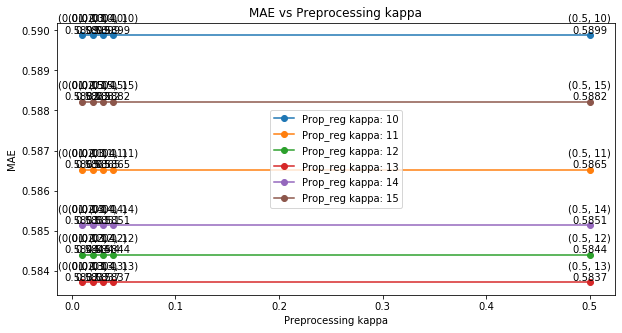

In [13]:
# Plot the MAE vs kappa curve for all combinations
fig, ax = plt.subplots(figsize=(10, 5))

for kappa_prop_reg in kappa_values_prop_reg:
    mae_values = [np.mean(mae_values_per_kappa[(kappa_preprocessing, kappa_prop_reg)]) for kappa_preprocessing in kappa_values_preprocessing]
    ax.plot(kappa_values_preprocessing, mae_values, '-o', label=f"Prop_reg kappa: {kappa_prop_reg}")

ax.set_xlabel('Preprocessing kappa')
ax.set_ylabel('MAE')
ax.set_title('MAE vs Preprocessing kappa')

# Add data labels for each point
for i, kappa_prop_reg in enumerate(kappa_values_prop_reg):
    mae_values = [np.mean(mae_values_per_kappa[(kappa_preprocessing, kappa_prop_reg)]) for kappa_preprocessing in kappa_values_preprocessing]
    for j, mae in enumerate(mae_values):
        ax.text(kappa_values_preprocessing[j], mae, f"({kappa_values_preprocessing[j]}, {kappa_prop_reg})\n{mae:.4f}", ha='center', va='bottom')

ax.legend()
plt.show()


In [10]:
# Print all the combinations of kappa values and their corresponding MAE values
print("Kappa combinations and their MAE values:")
for (kappa_preprocessing, kappa_prop_reg), mae in cv_results.items():
    print((kappa_preprocessing, kappa_prop_reg, mae))
 
# Print all the combinations of kappa values and their corresponding MAE values
print("Prop_reg kappa and their MAE values:")
for (kappa_preprocessing, kappa_prop_reg), mae in cv_results.items():
    print((kappa_prop_reg, mae))


Kappa combinations and their MAE values:
(0.01, 10, 0.5898759470744523)
(0.01, 11, 0.5865176365096066)
(0.01, 12, 0.5844028425511537)
(0.01, 13, 0.5837064816928036)
(0.01, 14, 0.585130012307665)
(0.01, 15, 0.5882107268998102)
(0.02, 10, 0.5898759470744523)
(0.02, 11, 0.5865176365096066)
(0.02, 12, 0.5844028425511537)
(0.02, 13, 0.5837064816928036)
(0.02, 14, 0.585130012307665)
(0.02, 15, 0.5882107268998102)
(0.03, 10, 0.5898759470744523)
(0.03, 11, 0.5865176365096066)
(0.03, 12, 0.5844028425511537)
(0.03, 13, 0.5837064816928036)
(0.03, 14, 0.585130012307665)
(0.03, 15, 0.5882107268998102)
(0.04, 10, 0.5898759470744523)
(0.04, 11, 0.5865176365096066)
(0.04, 12, 0.5844028425511537)
(0.04, 13, 0.5837064816928036)
(0.04, 14, 0.585130012307665)
(0.04, 15, 0.5882107268998102)
(0.5, 10, 0.5898759470744523)
(0.5, 11, 0.5865176365096066)
(0.5, 12, 0.5844028425511537)
(0.5, 13, 0.5837064816928036)
(0.5, 14, 0.585130012307665)
(0.5, 15, 0.5882107268998102)
Prop_reg kappa and their MAE values:
(10

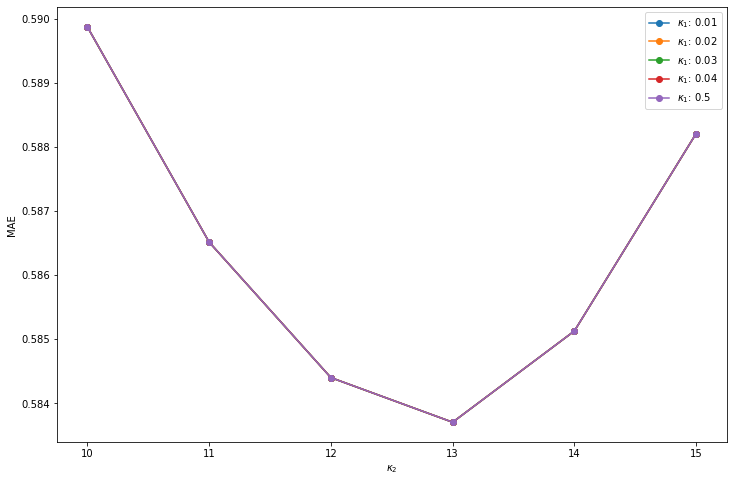

In [15]:
plt.figure(figsize=(12, 8))
for kappa_preprocessing in kappa_values_preprocessing:
    mae_values = [np.mean(mae_values_per_kappa[(kappa_preprocessing, kappa_prop_reg)]) for kappa_prop_reg in kappa_values_prop_reg]
    plt.plot(kappa_values_prop_reg, mae_values, '-o', label=f"$\\kappa_1$: {kappa_preprocessing}")

plt.xlabel('$\\kappa_2$')
plt.ylabel('MAE')
plt.legend()

# Save the plot as a PDF
plt.savefig('wineselect_mae_vs_predicting_kappa.pdf', format='pdf')

# Show the plot
plt.show()


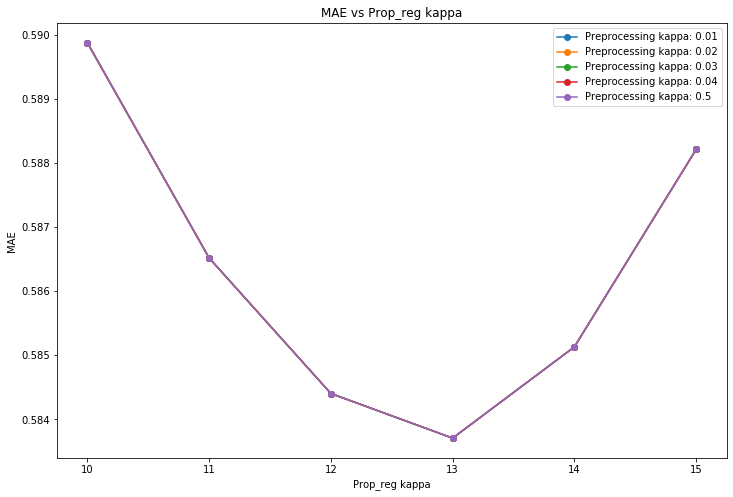

In [11]:
plt.figure(figsize=(12, 8))
for kappa_preprocessing in kappa_values_preprocessing:
    mae_values = [np.mean(mae_values_per_kappa[(kappa_preprocessing, kappa_prop_reg)]) for kappa_prop_reg in kappa_values_prop_reg]
    plt.plot(kappa_values_prop_reg, mae_values, '-o', label=f"Preprocessing kappa: {kappa_preprocessing}")

plt.xlabel('Prop_reg kappa')
plt.ylabel('MAE')
plt.title('MAE vs Prop_reg kappa')
plt.legend()
plt.show()

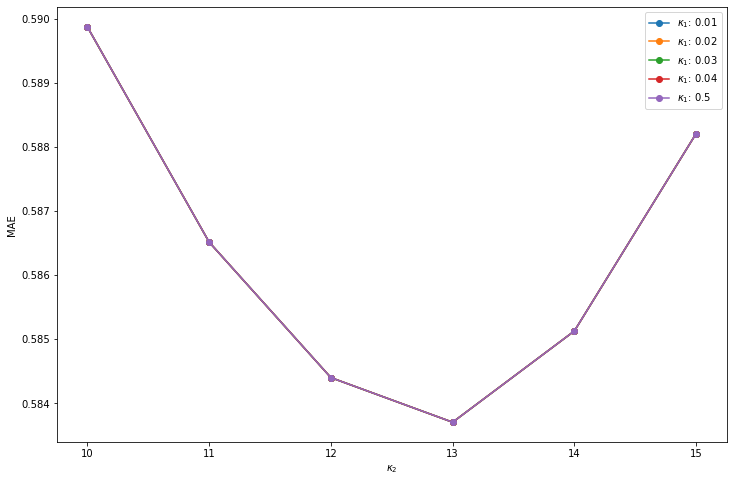

In [12]:
plt.figure(figsize=(12, 8))
for kappa_preprocessing in kappa_values_preprocessing:
    mae_values = [np.mean(mae_values_per_kappa[(kappa_preprocessing, kappa_prop_reg)]) for kappa_prop_reg in kappa_values_prop_reg]
    plt.plot(kappa_values_prop_reg, mae_values, '-o', label=f"$\\kappa_1$: {kappa_preprocessing}")

plt.xlabel('$\\kappa_2$')
plt.ylabel('MAE')
plt.legend()

# Save the plot as a PDF
plt.savefig('winefeature_mae_vs_predicting_kappa.pdf', format='pdf')

# Show the plot
plt.show()


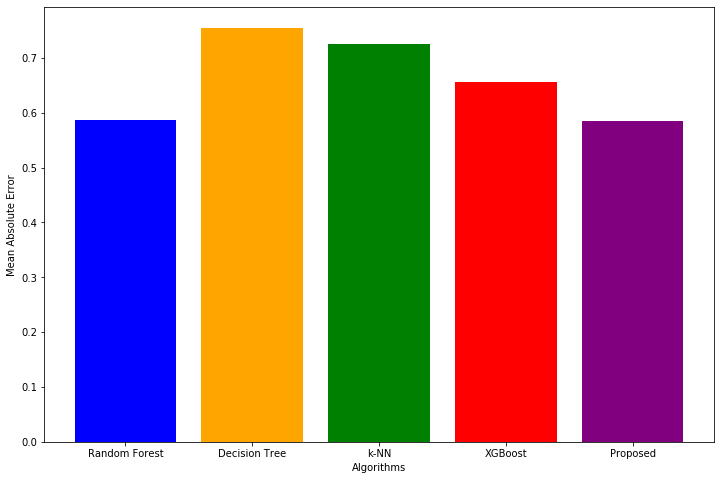

In [16]:
import matplotlib.pyplot as plt

# Results data
results = {
    'Random Forest': 0.586,
    'Decision Tree': 0.755,
    'k-NN': 0.726,
    'XGBoost': 0.655,
    'Proposed': 0.584,
}

# Plot the bar graph
fig, ax = plt.subplots(figsize=(12, 8))
ax.bar(results.keys(), results.values(), color=['blue', 'orange', 'green', 'red', 'purple'])
ax.set_xlabel('Algorithms')
ax.set_ylabel('Mean Absolute Error')

# Save the plot as a PDF
plt.savefig('winefeatureresults_bar_graph.pdf', format='pdf')

# Show the plot
plt.show()